# Load Dataset from kaggle

In [ ]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download ammarsayedtaha/arabic-sign-language-dataset-2022

100% 807M/808M [00:35<00:00, 24.9MB/s]
100% 808M/808M [00:35<00:00, 23.9MB/s]


In [ ]:
!unzip /content/arabic-sign-language-dataset-2022.zip

Streaming output truncated to the last 5000 lines.
  inflating: datasets/valid/images/23_19_M_haa_7.jpg  
  inflating: datasets/valid/images/23_19_M_haa_8.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_0.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_1.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_2.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_3.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_4.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_5.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_6.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_7.jpg  
  inflating: datasets/valid/images/23_19_M_jeem_8.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_0.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_1.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_2.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_3.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_4.jpg  
  inflating: datasets/valid/images/23_19_M_kaaf_5.jpg  

# Import Packages

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout 
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

from sklearn.metrics import classification_report,confusion_matrix

import tensorflow as tf

import cv2
import os

import numpy as np
import pandas as pd

# Read the Dataset

In [ ]:
def read_images(src, img_size):
    images = []
    for dirname, _, filenames in os.walk(src):
        for filename in sorted(filenames):
            img = cv2.imread(os.path.join(dirname, filename))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #convert colors into RGB
            img = cv2.resize(img, (img_size, img_size))
            images.append(img)
    return images

image_size = 416

# read train_images
train_images = read_images('/content/datasets/train/images', 
                           img_size=image_size)

# read test_images
test_images = read_images(src='/content/datasets/valid/images',
                          img_size=image_size)

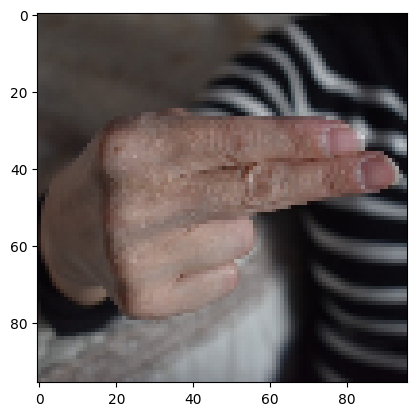

In [ ]:
plt.imshow(train_images[0])

In [ ]:
def read_labels(src):
    labels = []
    for dirname, _, filenames in os.walk(src):
        for filename in sorted(filenames):
            label = np.loadtxt((os.path.join(dirname, filename)), dtype=float)
            labels.append(label)
    return labels

# read train_labels 
train_labels = read_labels('/content/datasets/train/labels')
test_labels  = read_labels('/content/datasets/valid/labels')

In [ ]:
test_labels[2992]

array([17.        ,  0.46754808,  0.25480769,  0.17067308,  0.20673077])

In [ ]:
print(f"Length of traingin set: {len(train_images)}, labels: {len(train_labels)}")
print(f"Length of test set: {len(test_images)}, labels: {len(test_labels)}")

Length of traingin set: 9955, labels: 9955
Length of test set: 4247, labels: 4247


## Drop Data that has more than a single hand 

In [ ]:
# get the indices of the images that has more than 1 hand 

# get length of each numpy array to check if there are images that have more than one hand
train_labels_length = np.array([len(i) for i in train_labels])
test_labels_length = np.array([len(i) for i in test_labels])

# get indices of the images that has 2 hands
train_indices = np.argwhere(train_labels_length == 2)
test_indices = np.argwhere(test_labels_length == 2)

In [ ]:
train_indices

array([[7991]])

In [ ]:
 train_labels[train_indices[0][0]]

array([[4.        , 0.44230769, 0.43990385, 0.31730769, 0.27884615],
       [4.        , 0.4375    , 0.43509615, 0.31730769, 0.27884615]])

In [ ]:
test_indices

array([[3974],
       [3984],
       [3985],
       [3992],
       [3993]])

In [ ]:
 for i in range(len(test_indices)):
   print(test_labels[test_indices[i][0]])

[[1.         0.73317308 0.41105769 0.47596154 0.5       ]
 [1.         0.21875    0.41225962 0.43269231 0.54086538]]
[[2.         0.63221154 0.50600962 0.25961538 0.53605769]
 [2.         0.23317308 0.45673077 0.26923077 0.54807692]]
[[2.         0.59134615 0.48317308 0.125      0.26442308]
 [2.         0.23677885 0.48677885 0.18509615 0.30528846]]
[[3.         0.76442308 0.44591346 0.37019231 0.64663462]
 [3.         0.18149038 0.45192308 0.35817308 0.65384615]]
[[3.         0.74399038 0.50120192 0.24759615 0.40625   ]
 [3.         0.22716346 0.51322115 0.25240385 0.43509615]]


In [ ]:
X_train = []
y_train = []
X_test  = []
y_test  = []

In [ ]:
### Drop these indices from the data 
for j, i in enumerate(train_labels):
    if j not in train_indices:
        X_train.append(train_images[j])
        y_train.append(train_labels[j])
        
for j, i in enumerate(test_labels):
    if j not in test_indices:
        X_test.append(test_images[j])
        y_test.append(test_labels[j])

In [ ]:
print(f"Length of traingin set after droping: {len(X_train)}, labels: {len(y_train)}")
print(f"Length of test set after droping: {len(X_test)}, labels: {len(y_test)}")

Length of traingin set after droping: 9954, labels: 9954
Length of test set after droping: 4242, labels: 4242


In [ ]:
# Extract just the class without the location 
train_classes = [int(i[0]) for i in y_train]
test_classes = [int(i[0]) for i in y_test]

# Visualize Data

/usr/local/lib/python3.9/dist-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


Text(0.5, 1.0, '[24.          0.59975962  0.49158654  0.37259615  0.53605769]')

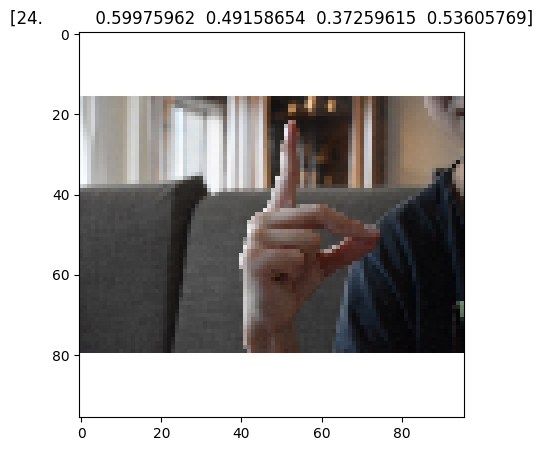

In [ ]:
plt.figure(figsize = (5,5))
plt.imshow(X_train[500])
plt.title(y_train[500])

<Axes: xlabel='label', ylabel='count'>

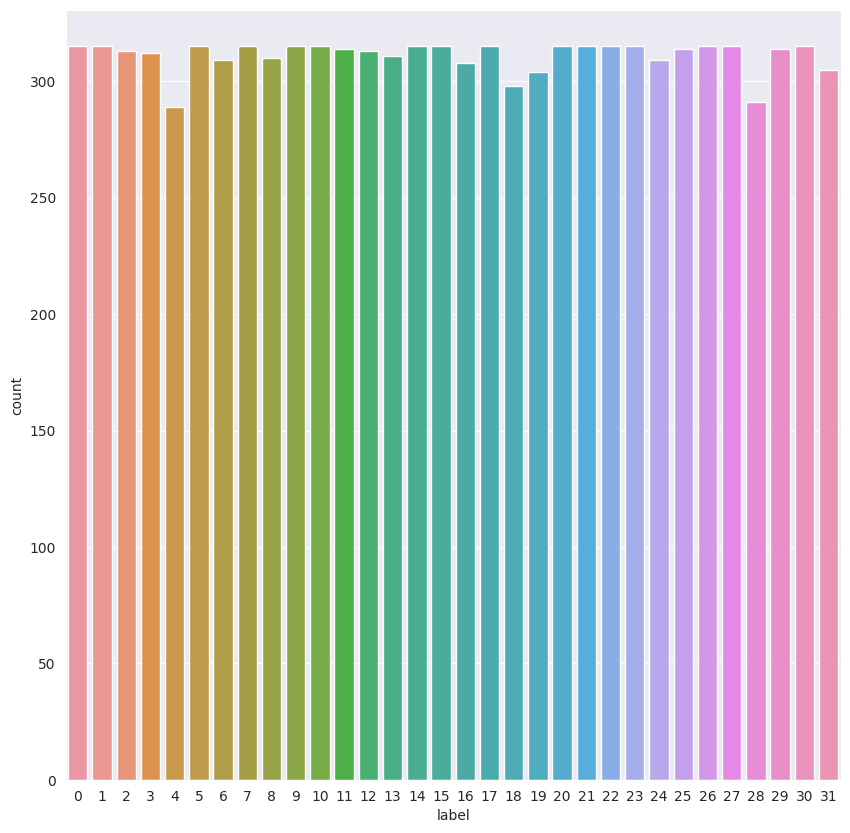

In [ ]:
# check if the data is balanced or not
labels = pd.DataFrame(train_classes, columns=['label'])
plt.figure(figsize = (10,10)) # Label Count
sns.set_style("darkgrid")
sns.countplot(data=labels, x="label")

In [ ]:
labels.nunique()

label    32
dtype: int64

#Remove images have more than one label from dataset

In [ ]:
import os

# specify the path to the directory containing the image and label files
directory_path = '/content/datasets/train'

# get a list of all the image files in the directory
image_files = [f for f in os.listdir('/content/datasets/train/images') if f.endswith('.jpg')]

# loop through the image files and check for duplicates in the label data
duplicate_images = []
for image_file in image_files:
    label_file = image_file.replace('.jpg', '.txt')
    label_path = os.path.join('/content/datasets/train/labels', label_file)
    with open(label_path, 'r') as f:
        label_data = f.read()
    label_lines = label_data.strip().split('\n')
    if len(label_lines) > 1:
        duplicate_images.append(image_file)

# print the list of images with more than one label
print(duplicate_images)

['229_20_M_dal_1.jpg']


In [ ]:
# loop through the duplicate images and delete them and their label files
for image_file in duplicate_images:
    label_file = image_file.replace('.jpg', '.txt')
    image_path = os.path.join('/content/datasets/train/images', image_file)
    label_path = os.path.join('/content/datasets/train/labels', label_file)
    os.remove(image_path)
    os.remove(label_path)

In [ ]:
import os

# specify the path to the directory containing the image and label files
directory_path = '/content/datasets/valid'

# get a list of all the image files in the directory
image_files = [f for f in os.listdir('/content/datasets/valid/images') if f.endswith('.jpg')]

# loop through the image files and check for duplicates in the label data
duplicate_images = []
for image_file in image_files:
    label_file = image_file.replace('.jpg', '.txt')
    label_path = os.path.join('/content/datasets/valid/labels', label_file)
    with open(label_path, 'r') as f:
        label_data = f.read()
    label_lines = label_data.strip().split('\n')
    if len(label_lines) > 1:
        duplicate_images.append(image_file)

# print the list of images with more than one label
print(duplicate_images)

['831_23_M_al_6.jpg', '831_23_M_bb_6.jpg', '831_23_M_aleff_8.jpg', '831_23_M_aleff_7.jpg', '831_23_M_bb_7.jpg']


In [ ]:
# loop through the duplicate images and delete them and their label files
for image_file in duplicate_images:
    label_file = image_file.replace('.jpg', '.txt')
    image_path = os.path.join('/content/datasets/valid/images', image_file)
    label_path = os.path.join('/content/datasets/valid/labels', label_file)
    os.remove(image_path)
    os.remove(label_path)

#Install yolov5 model

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 15535, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 15535 (delta 54), reused 91 (delta 43), pack-reused 15393
Receiving objects: 100% (15535/15535), 14.59 MiB | 14.27 MiB/s, done.
Resolving deltas: 100% (10582/10582), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.2 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Download Correctly Formatted Custom Dataset 


In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
%cat /content/datasets/sign.yaml


# Train/val sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt

train: ../datasets/train/images  # train images (relative to 'path') ArSL v1/ArSL2022_dataset/data/sign_data/
val:   ../datasets/valid/images  # val images (relative to 'path')

# Classes
nc: 32  # number of classes
names: ['ain', 'al', 'aleff','bb','dal','dha','dhad','fa','gaaf','ghain','ha','haa','jeem','kaaf','khaa','la','laam',
        'meem','nun','ra','saad','seen','sheen','ta','taa','thaa','thal','toot','waw','ya','yaa','zay'] # class names



# Define Model Configuration and Architecture

In [ ]:
# define number of classes based on YAML
import yaml
with open( "/content/datasets/sign.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: 32  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data /content/datasets/sign.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-04-19 06:50:00.017875: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/datasets/sign.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 511 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparame

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

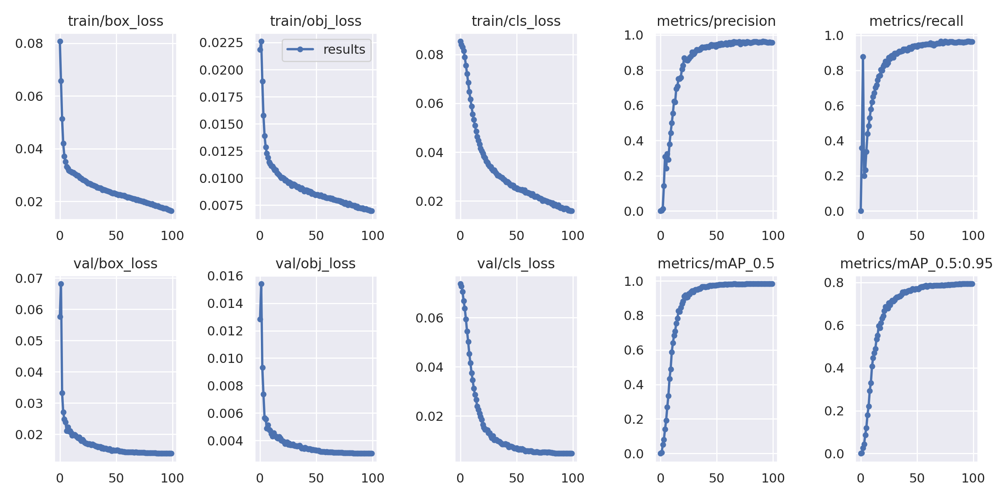

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

#Visualize Our Training Data with Labels



GROUND TRUTH AUGMENTED TRAINING DATA:


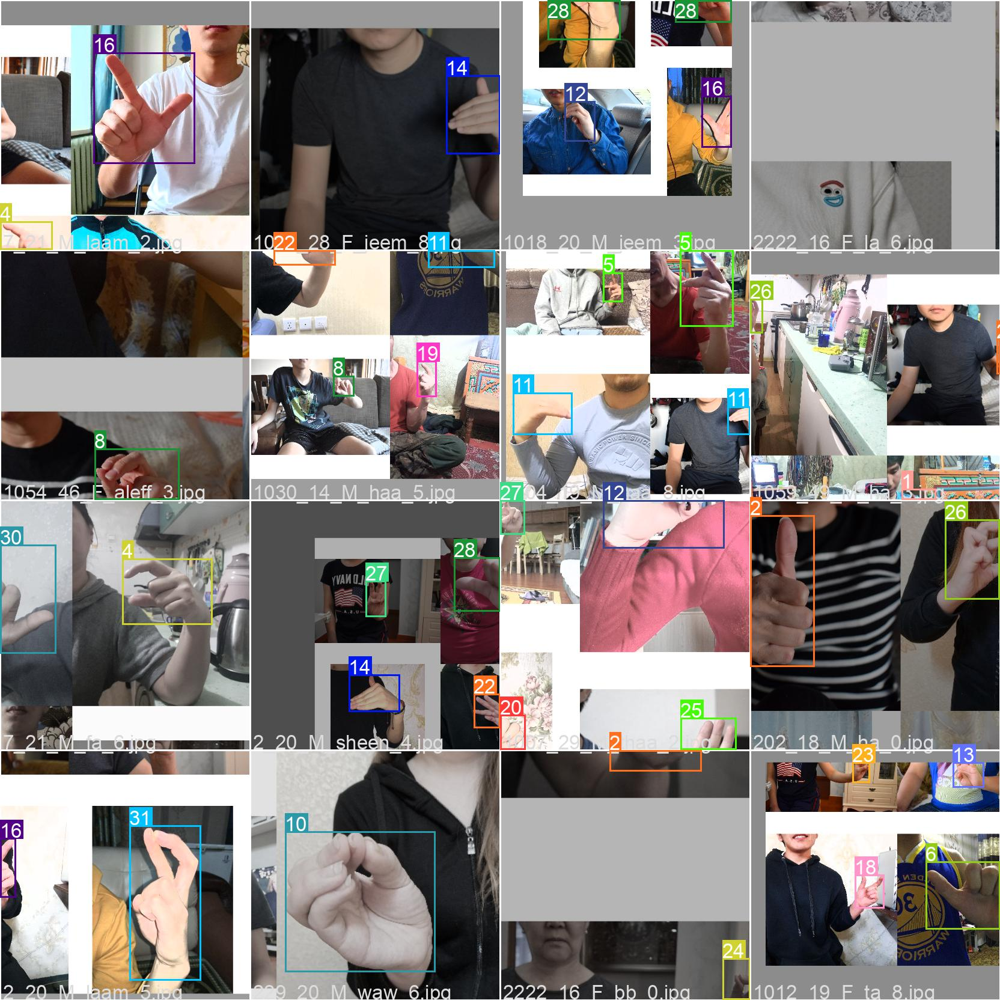

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights


In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../datasets/valid/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../datasets/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7330125 parameters, 0 gradients, 17.0 GFLOPs
image 1/4242 /content/datasets/valid/images/1003_19_F_ain_0.jpg: 416x416 1 ain, Done. (0.008s)
image 2/4242 /content/datasets/valid/images/1003_19_F_ain_1.jpg: 416x416 1 ain, Done. (0.008s)
image 3/4242 /content/datasets/valid/images/1003_19_F_ain_2.jpg: 416x416 1 ain, Done. (0.008s)
image 4/4242 /content/datasets/vali

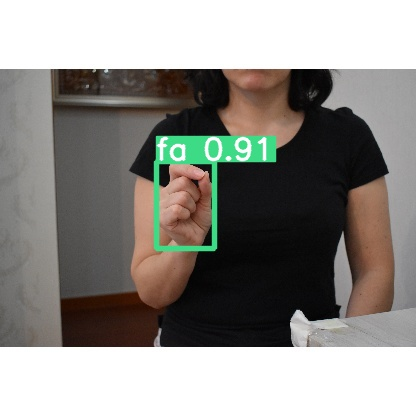

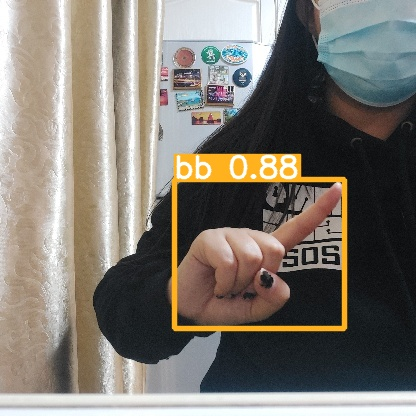

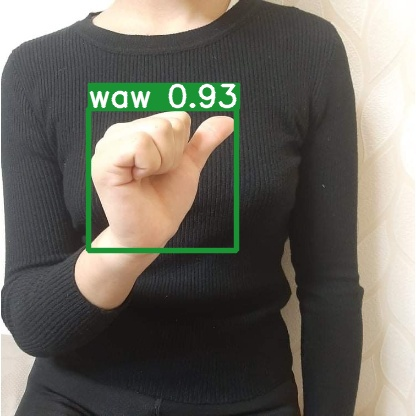

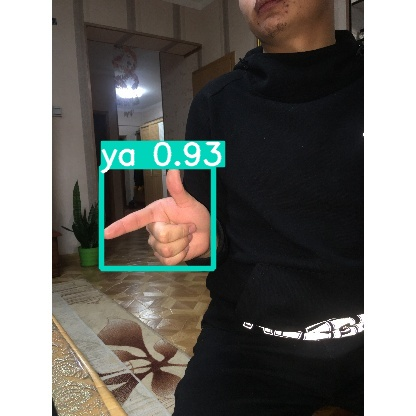

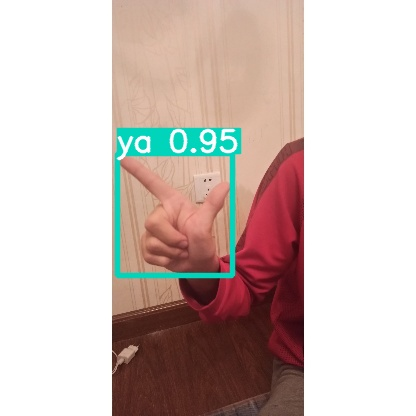

...

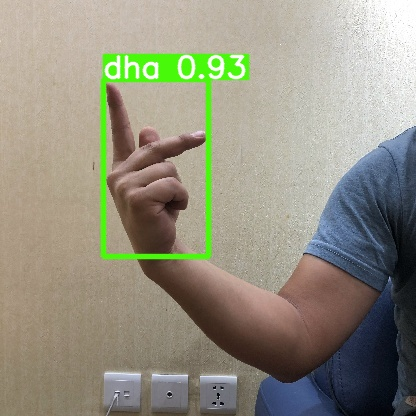

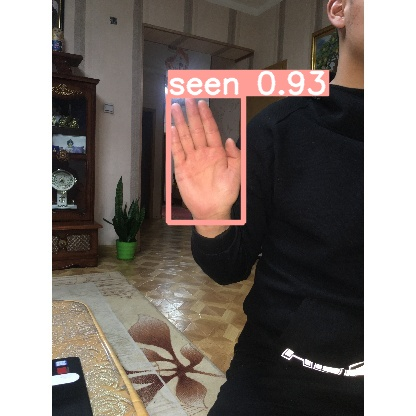

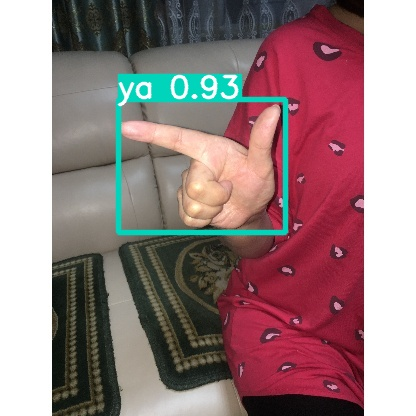

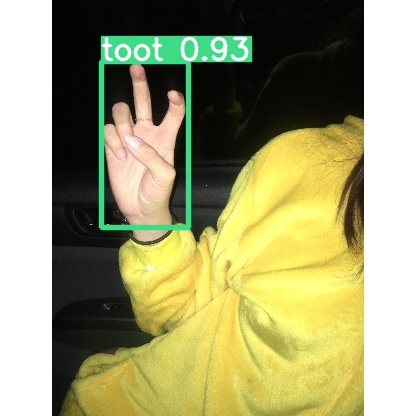

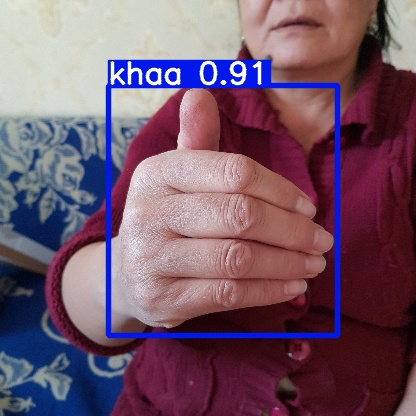

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above
n=0 
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
    n=n+1
    if n== 20 :
     break


# Export Trained Weights for Future Inference



In [ ]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [ ]:
# %cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive